In [1]:
import aptwrapper
import yaml
import pandas as pd
import xarray as xr
import numpy as np
import pickle
import matplotlib.pyplot as plt
from skimage import segmentation, morphology, filters, measure
import ipywidgets as widgets
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec

# File viewer

In [14]:
def show_map_overview(doc, include='', exclude=''):
    df = pd.DataFrame([{
            'Label': k,
            'Wavenumber': int(v['Tags.IRWavenumber'].item()), 
            'Scan Rate': v['Tags.ScanRate'].item(),
            'TimeStamp': pd.to_datetime(v['TimeStamp'].item()).round('s'), 
            'dx': len(v.x),
            'dy': len(v.y),
            'X0': np.round(v.X.mean().item(), 3),
            'Y0': np.round(v.Y.mean().item(), 3),
            'dX': np.round(v.X.max().item() - v.X.min().item(), 3),
            'dY': np.round(v.Y.max().item() - v.Y.min().item(), 3),
        } 
        for k, v in doc.HeightMaps.items() 
        if include in k and (exclude == '' or exclude not in k)
    ])

    if len(df) == 0:
        display(f"No maps found for include='{include}' and exclude='{exclude}'")
        return

    display(df.sort_values('TimeStamp'))
    fig, ax = plt.subplots(1, len(df), figsize=(5*len(df), 3), squeeze=False)
    for i,k in enumerate(df.Label):
        aptwrapper.plot_map(doc.HeightMaps[k], ax=ax[0, i], cb_label='', annotation='')
        ax[0, i].set_title(k)
        
def plot_raw_data_single_channel(
        hmap, hmap_retrace=None, gs=None, show_sb_val=True, ylabel=None
):
    if gs is None:
        fig = plt.figure()
        gs = GridSpec(1, 1)[0, 0]
    else:
        fig = gs.get_topmost_subplotspec().get_gridspec().figure

    # Build axes
    subgs = GridSpecFromSubplotSpec(
        2, 3, subplot_spec=gs, wspace=.1, hspace=.1, 
        width_ratios=[.2,1,.05], height_ratios=[1,.2]
    )
    ax_main=fig.add_subplot(subgs[0,1])
    ax_cb=fig.add_subplot(subgs[0, 2])
    ax_trace_vert=fig.add_subplot(subgs[0,0])
    ax_trace_ho=fig.add_subplot(subgs[1,1])

    # Plot main image
    hmap = aptwrapper.default_flatten(hmap)
    extent = [hmap.X.min(), hmap.X.max(), hmap.Y.min(), hmap.Y.max()]
    m = ax_main.imshow(
        hmap.data, cmap=aptwrapper.default_cmap(hmap), 
        extent=extent, 
        vmin=np.percentile(hmap.data, 1), 
        vmax=np.percentile(hmap.data, 99)
    )

    # Add scalebar, colorbar and title
    aptwrapper.add_scalebar(ax_main, show_value=show_sb_val)
    ax_main.set(xticks=[], yticks=[])
    fig.colorbar(m, cax=ax_cb, extend='both')
    ax_main.set_title(aptwrapper.default_cblabel(hmap))

    # Plot profiles
    hmap_f = aptwrapper.default_flatten(hmap).data
    line_i = hmap.shape[0] // 2
    ii = np.arange(hmap.shape[1])
    ax_trace_vert.plot(hmap_f[:, line_i], ii, lw=.5)
    ax_trace_ho.plot(hmap_f[line_i], lw=.5)
    ax_trace_ho.set(xticks=[], yticks=[])
    ax_trace_vert.set(xticks=[], yticks=[])
    if show_sb_val and ylabel is not None: 
        ax_trace_vert.set_ylabel(ylabel)

    if hmap_retrace is not None:
        hrf = aptwrapper.default_flatten(hmap_retrace).data
        ax_trace_vert.plot(hrf[:, line_i], ii, lw=.5)
        ax_trace_ho.plot(hrf[line_i], lw=.5)

    # Resize figure such that main image is square
    _, _, w, h = ax_main.get_window_extent().bounds
    fig.set_size_inches(fig.get_figwidth(), fig.get_figheight() * w/h)

def plot_raw_data_all_channels(doc, map_i=None, hmap=None, timestamp=None, gs=None, ylabel=None):

    # Determine which concurrent maps to plot
    if map_i is not None:
        channels = [k for k in doc.HeightMaps if k.endswith(' ' +str(map_i))]
    elif hmap is not None:
        if isinstance(hmap, str):
            hmap = doc.HeightMaps[hmap]
        channels = [
            k for k, v in doc.HeightMaps.items()
            if ' (1)' not in k and v.TimeStamp.item() == hmap.TimeStamp.item()
        ]
    elif timestamp is not None:
        channels = [
            k for k, v in doc.HeightMaps.items()
            if ' (1)' not in k and str(v.TimeStamp.item().round('s')) == str(timestamp)
        ]
    else:
        raise ValueError("Either hmap, map_i or timestamp must be given")

    # Sort channels in a desired order
    def sorter(x):
        order = ['Height', 'Deflection', 'IR Amplitude', 'PLL Frequency', 'IR Phase']
        return order.index(x) if x in order else 999
    channels = sorted(channels, key=sorter)
    n = len(channels)

    # Define figure layout
    if gs is None: 
        gs = GridSpec(1, 1, figure=plt.figure(figsize=(3*n, 5)))
    subgs = GridSpecFromSubplotSpec(
        1, n, subplot_spec=gs[0,0], wspace=.4
    )

    for i, c in enumerate(channels):
        plot_raw_data_single_channel(
            doc.HeightMaps[c], doc.HeightMaps.get(c + ' (1)'), gs=subgs[i], show_sb_val=i==0, ylabel=ylabel
        )
def output_map_qc(doc):
    def w():
    
        # aptwrapper.plot_all_maps(doc)
        timepoints = {k: pd.to_datetime(v['TimeStamp'].item()).round('s') for k, v in doc.HeightMaps.items()}
        display(pd.DataFrame({
            t: [
                k for k, v in doc.HeightMaps.items() if pd.to_datetime(v['TimeStamp'].item()).round('s') == t
            ]
            for t in np.unique(list(timepoints.values()))
        }).T)

    return w

def show_spectrum_qc(doc, gs=None, highlight_spectrum=None, show_pll=True, show_phase=True):
    if gs is None:
        fig, ax = plt.subplots(1, 2, figsize=(10, 3.4), gridspec_kw={'width_ratios': [1,1]})
    else:
        fig = gs.get_topmost_subplotspec().get_gridspec().figure
        subgs = GridSpecFromSubplotSpec(1, 2, subplot_spec=gs, width_ratios=[1,2])
        ax = [fig.add_subplot(subgs[i]) for i in range(2)]

    # Build axes
    ax_map, ax_main = ax
    ax_iramp = ax_main.twinx()
    ax_main.set_visible(False)
    ax_iramp.yaxis.set_label_position('left')
    ax_iramp.yaxis.set_ticks_position('left')
    if show_pll and show_phase:
        ax_pll   = ax_main.twinx()
        ax_phase = ax_main.twinx()
        ax_phase.spines['right'].set_visible(True)
        ax_phase.spines['right'].set_position(('outward', 60))
        ax_phase.yaxis.set_label_position('right')
        ax_phase.yaxis.set_ticks_position('right')

    elif show_pll:
        ax_pll = ax_main.twinx()
    elif show_phase:
        ax_phase = ax_main.twinx()

    # Plot spectra    
    for l, s in doc.RenderedSpectra.items():
        lw = .5 if l != highlight_spectrum else 2
        c = 'w' 
        ec  = 'C0' 
        ms = 40 if l != highlight_spectrum else 81
        aptwrapper.mark_location(s, ax=ax_map, c=c, ec=ec, s=ms)
        ax_iramp.plot(s.v, s['IR Amplitude (mV)'], label=l, lw=lw, c='C0')
        if show_pll:
            ax_pll.plot(s.v, s['PLL Frequency (kHz)'], lw=lw, c='C1')
        if show_phase:
            ax_phase.plot(s.v, s['IR Phase (Deg)'], lw=lw*.5, c='C2')
    
    ax_iramp.invert_xaxis()
    ax_iramp.set_xlabel('Wavenumber (cm⁻¹)')
    ax_iramp.set_ylabel('IR Amplitude (a.u.)', color='C0')
    if show_pll:
        ax_pll.set_ylabel('PLL Frequency (kHz)', color='C1')
    if show_phase:
        ax_phase.set_ylabel('IR Phase (Deg)', color='C2')

    # Plot most recent map
    ref_spec = doc.RenderedSpectra[highlight_spectrum or list(doc.RenderedSpectra)[-1]]
    time_spec = ref_spec['TimeStamp'].item()
    valid_times = [v['TimeStamp'].item() for v in doc.HeightMaps.values() if v['TimeStamp'].item() < time_spec]
    map_time = max(valid_times)
    valid_maps = [k for k, v in doc.HeightMaps.items() if v['TimeStamp'].item() == map_time]
    valid_irmaps = [k for k in valid_maps if 'IR Amplitude' in k]
    valid_hmaps = [k for k in valid_maps if 'Height' in k]
    if len(valid_irmaps) > 0:
        aptwrapper.plot_map(doc.HeightMaps[valid_irmaps[-1]], ax=ax_map)
    elif len(valid_hmaps) > 0:
        aptwrapper.plot_map(doc.HeightMaps[valid_hmaps[-1]], ax=ax_map)
    else:
        aptwrapper.plot_map(doc.HeightMaps[valid_maps[-1]], ax=ax_map)

def file_viewer(doc):
    # Map overview ----
    w_include = widgets.Text(value='IR Amplitude', description='Include:')
    w_exclude = widgets.Text(value='(1)', description='Exclude:')
    w_map_overview = widgets.VBox([
        widgets.HBox([w_include, w_exclude]),
        widgets.interactive_output(lambda i, e: show_map_overview(doc, i, e), {
            'i': w_include, 
            'e': w_exclude,
        })
    ])

    # Map QC ----
    maps_and_ts = {k: v['TimeStamp'].item() for k, v in doc.HeightMaps.items()}
    ts_and_maps = {
        t: [k for k, v in maps_and_ts.items() if v == t]
        for t in np.unique(list(maps_and_ts.values()))
    }
    def show_options():
        for k, v in ts_and_maps.items():
            print(pd.to_datetime(k).round('s'), v)

    selection_options = [f'{pd.to_datetime(k).round("s")} ({v[0]})' for k, v in ts_and_maps.items()]

    w_maps_dropdown = widgets.Dropdown(options=selection_options)
    w_maps_slider = widgets.IntSlider(min=0, max=len(selection_options)-1, description='Choose map')
    widgets.jslink((w_maps_dropdown, 'index'), (w_maps_slider, 'value'))
    w_map_qc = widgets.VBox([
        # widgets.Label('Available timepoints'),
        # widgets.interactive_output(show_options, {}),
        widgets.HBox([
            w_maps_slider,
            w_maps_dropdown,
        ]),
        widgets.interactive_output(
            lambda i: plot_raw_data_all_channels(doc, hmap=list(ts_and_maps.values())[i][0]),
            {'i': w_maps_slider}
        ),
    ])

    # Spectra QC ----
    list_spectra = list(doc.RenderedSpectra)
    if len(list_spectra) == 0:
        w_spectra = widgets.Label('No spectra found')
    else: 
        w_list_spectra_dropdown = widgets.Dropdown(options=list_spectra)
        w_list_spectra_slider = widgets.IntSlider(min=0, max=len(list_spectra)-1, value=1)
        widgets.jslink((w_list_spectra_dropdown, 'index'), (w_list_spectra_slider, 'value'))
        w_show_pll = widgets.Checkbox(value=True, description='Show PLL')
        w_show_phase = widgets.Checkbox(value=False, description='Show Phase')
        w_incr_index = widgets.Button(description='+')       
        w_decr_index = widgets.Button(description='-')
        
        def increment_slider(c):
            v = w_list_spectra_slider.value
            w_list_spectra_slider.value = min(v+1, w_list_spectra_slider.max)
        def decrement_slider(c):
            v = w_list_spectra_slider.value
            w_list_spectra_slider.value = max(v-1, w_list_spectra_slider.min)
        w_incr_index.on_click(increment_slider)
        w_decr_index.on_click(decrement_slider)

        w_spectra = widgets.VBox([
            widgets.HBox([
                widgets.VBox([
                    w_list_spectra_dropdown, 
                    widgets.HBox([w_decr_index, w_incr_index]),
                    w_list_spectra_slider,  
                ]),
                widgets.VBox([w_show_pll, w_show_phase,]),
            ]),
            widgets.interactive_output(
                lambda label, show_pll, show_phase: show_spectrum_qc(doc, highlight_spectrum=label, show_pll=show_pll, show_phase=show_phase), {
                'label': w_list_spectra_dropdown,
                'show_pll': w_show_pll,
                'show_phase': w_show_phase,
            }),
        ])


    # Tab ----
    w_tab = widgets.Tab()
    w_tab.children = [w_map_overview, w_map_qc, w_spectra]
    w_tab.titles = ['Maps', 'Map QC', 'Spectra']
    w_tab.selected_index = 2
    return w_tab

file_viewer(aptwrapper.read(
    '../primary_data/fig2_wt_repeats/extra_repeats/2024-06-05_TB012D_WT10jan_spectra.axz'
))

## Show all pll maps in a file

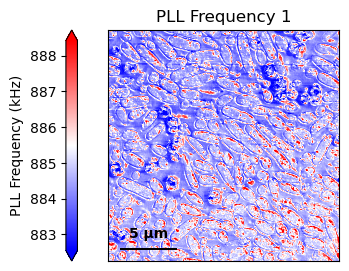

In [16]:
def view_pll(path):
    doc = aptwrapper.read(path, cache=False)
    maps = {k: v for k, v in doc.HeightMaps.items() 
            if 'PLL' in k and '(1)' not in k}
    
    if len(maps) == 0: return 
    fig, ax = plt.subplots(1, len(maps), figsize=(4*len(maps), 3))
    if len(maps) == 1: ax=[ax]

    for i, irmap in enumerate(maps):
        m=aptwrapper.plot_map(doc.HeightMaps[irmap], ax=ax[i], robust=True)
        ax[i].set_title(irmap)
        # ax[i].axis('off')
        # fig.colorbar(m, ax=ax[i])

view_pll('../primary_data/fig3_recovery_timeline/november/20231116_r1a_maps_tb009g_after_crash.axz')

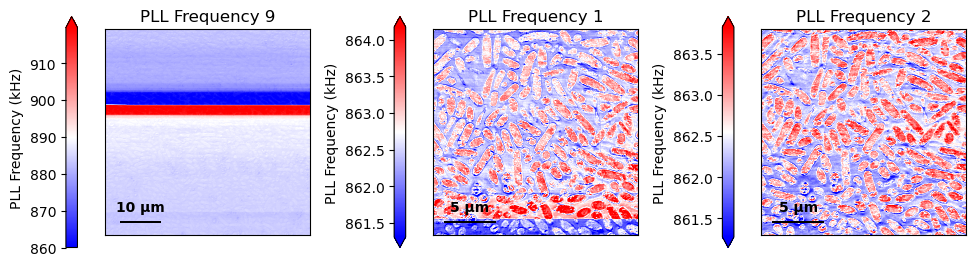

In [17]:
view_pll('../primary_data/fig3_recovery_timeline/november/20231116_r1a_maps_tb009h.axz')

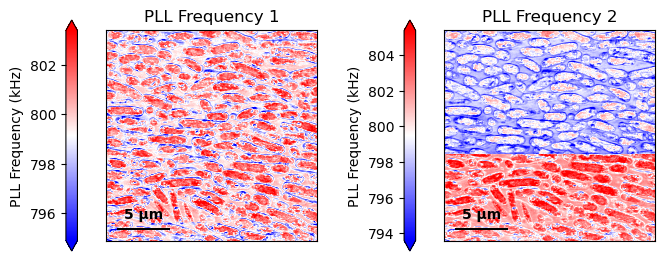

In [18]:
view_pll('../primary_data/fig3_recovery_timeline/november/20231127_hc_maps_tb010c.axz')

# Consolidate and save metadata

In [40]:
def load_yaml(path, **kwargs):
    with open(path, 'r') as f:
        return pd.DataFrame(yaml.safe_load(f)).assign(**kwargs)
    
metadata = [
    # WT repeats
    load_yaml(
        '../primary_data/fig2_wt_repeats/metadata.yml',
        folder = '../primary_data/fig2_wt_repeats/',
        experiment = 'wt_repeats'
    ),
    # Recovery timeline (april)
    load_yaml(
        '../primary_data/fig3_recovery_timeline/april/metadata.yml',
        folder = '../primary_data/fig3_recovery_timeline/april/',
        experiment = 'recovery_timeline',
        series = 'april',
        cantilever = 'TB008D'
    ),
    # Recovery timeline (july)
    load_yaml(
        '../primary_data/fig3_recovery_timeline/july/metadata.yml',
        folder = '../primary_data/fig3_recovery_timeline/july/',
        experiment = 'recovery_timeline',
    ),
    # Recovery timeline (november)
    load_yaml(
        '../primary_data/fig3_recovery_timeline/november/0.metadata.yml',
        folder = '../primary_data/fig3_recovery_timeline/november/',
        experiment = 'recovery_timeline'
    ),
    # Stress screem
    load_yaml(
        '../primary_data/fig4_stress/new_metadata.yml',
        folder='../primary_data/fig4_stress/',
        experiment = 'chemical_stress_screen'
    ),
    # Peroxide validation
    load_yaml(
        '../primary_data/fig4_stress_validation/0.metadata.yml',
        folder='../primary_data/fig4_stress_validation/',
        experiment = 'chemical_stress_validation'
    )
]

def gen_sample_id(r):
    if r.experiment == 'wt_repeats':
        return f'{r["experiment"]}_{r["sample"]}'
    if r.experiment == 'recovery_timeline':
        return f"{r['experiment']}_{r['series']}_{r['condition']}{r['replicate']}"
    if r.experiment == 'chemical_stress_screen':
        return f"{r['experiment']}_{r['condition']}"
    if r.experiment == 'chemical_stress_validation':
        return f"{r['experiment']}_{r['condition']}_{r['replicate']}"
        
def gen_dataset_id(r):
    if r.experiment == 'wt_repeats':
        return f'{r["experiment"]}_{r["sample"]}_rep{int(r["repeat"])}'
    elif r.experiment == 'recovery_timeline':
        return f"{r['experiment']}_{r['series']}_{r['condition']}{r['replicate']}"
    elif r.experiment == 'chemical_stress_screen':
        return f"{r['experiment']}_{r['condition']}_{r['date']}"
    if r.experiment == 'chemical_stress_validation':
        return f"{r['experiment']}_{r['condition']}_{r['replicate']}"
    
def time_post_shock(r):
    times = {'B': -1, 'H': 0, 'R5': 0.5, 'R1': 1, 'R2': 2}
    return times[r.condition] if r.experiment == 'recovery_timeline' else None

metadata = pd.concat(metadata).reset_index(drop=True)
metadata['sample_id'] = metadata.apply(gen_sample_id, axis=1)
metadata['dataset_id'] = metadata.apply(gen_dataset_id, axis=1)
metadata['time_post_shock'] = metadata.apply(time_post_shock, axis=1)

# Save to cache
pickle.dump(metadata, open('./cache/metadata.pkl', 'wb'))
metadata = pickle.load(open('./cache/metadata.pkl', 'rb'))
metadata.head()

,file,sample,repeat,amp1625,amp1650,spectra_ib,spectra_cp,spectra_bg,folder,experiment,condition,replicate,spectra_loc,series,cantilever,date,sample_id,dataset_id,time_post_shock
0,doc_WTA_rep1_data.axz,M1A,1.0,1.0,2.0,"[2, 3, 4, 5, 6]","[7, 8, 9, 10, 11]","[12, 13, 14, 15, 16]",../primary_data/fig2_wt_repeats/,wt_repeats,NaN,NaN,NaN,NaN,NaN,NaN,wt_repeats_M1A,wt_repeats_M1A_rep1,NaN
1,doc_WTA_rep2_data.axz,M1A,2.0,1.0,2.0,"[5, 6, 7, 8, 9]","[10, 11, 12, 13, 14]","[15, 16, 17, 18, 19]",../primary_data/fig2_wt_repeats/,wt_repeats,NaN,NaN,NaN,NaN,NaN,NaN,wt_repeats_M1A,wt_repeats_M1A_rep2,NaN
2,doc_WTA_rep3_data.axz,M1A,3.0,1.0,2.0,"[4, 5, 6, 7, 8]","[9, 10, 11, 12, 13]","[14, 15, 16, 17, 18]",../primary_data/fig2_wt_repeats/,wt_repeats,NaN,NaN,NaN,NaN,NaN,NaN,wt_repeats_M1A,wt_repeats_M1A_rep3,NaN
3,doc_WTA_rep4_data.axz,M1A,4.0,1.0,2.0,"[3, 4, 5, 6, 7]","[8, 9, 10, 11, 12]","[13, 14, 15, 16, 17]",../primary_data/fig2_wt_repeats/,wt_repeats,NaN,NaN,NaN,NaN,NaN,NaN,wt_repeats_M1A,wt_repeats_M1A_rep4,NaN
4,doc_WTB_rep1_data.axz,M1B,1.0,1.0,2.0,"[2, 3, 4, 5, 6]","[7, 8, 9, 10, 11]","[12, 13, 14, 15]",../primary_data/fig2_wt_repeats/,wt_repeats,NaN,NaN,NaN,NaN,NaN,NaN,wt_repeats_M1B,wt_repeats_M1B_rep1,NaN


# Load spectra

In [41]:
def load_spectra_from_file(metadata):
    # print(f'> Reading {metadata.folder + metadata.file}')

    # Make list of spectra indices
    isna = lambda x: [not type(xi) == str and np.isnan(xi) for xi in x]
    sanitise = lambda x: x if type(x) == list and len(x) > 0 else []
    i_ib = sanitise(metadata.spectra_ib)
    i_cp = sanitise(metadata.spectra_cp)
    i_bg = sanitise(metadata.spectra_bg)
    ii = i_ib + i_cp + i_bg

    # If no spectra, return None
    if len(ii) == 0: return None

    # Read from file
    doc = aptwrapper.read(metadata.folder + metadata.file)
    spectrum_labels = [(i if type(i) == str else f'Spectrum {i}') for i in ii]
    spectrum_list = [doc.RenderedSpectra[sl] for sl in spectrum_labels]

    skipcols = ['amp1625','amp1650','spectra_ib','spectra_cp','spectra_bg',]
    md_to_save = metadata.drop(skipcols).to_dict() 
    bgs = [s.BackgroundFileName.item().split('\\')[-1] for s in spectrum_list]
    
    # Return concatenated spectra with metadata
    return (
        xr.concat(spectrum_list, 'si')
        .assign_coords(
            **md_to_save,
            feature = ('si', ['ib'] * len(i_ib) + 
                             ['cp'] * len(i_cp) + 
                             ['bg'] * len(i_bg)),
            bg_filename = ('si', bgs),
            Label = ('si', spectrum_labels),
        )
    )

# Load spectra
spectra = [load_spectra_from_file(f) for i,f in metadata.iterrows()]
spectra = [s for s in spectra if s is not None]

Separate spectra by wavenumber axis (even or uneven)

In [42]:
spectra = xr.concat(spectra, 'si')
odd_v_mask = spectra['IR Amplitude (mV)'].sel(v=1500).isnull()
odd_v_axis = spectra.v[spectra.v % 2 != 0]
even_v_axis = spectra.v[spectra.v % 2 == 0]
spectra_veven = spectra.sel(v=even_v_axis).isel(si=~odd_v_mask.data)
spectra_vodd = spectra.sel(v=odd_v_axis).isel(si=odd_v_mask.data)

Save to pickle

In [43]:
with open('./cache/spectra_veven_raw.pkl', 'wb') as f:
    pickle.dump(spectra_veven, f)
    
with open('./cache/spectra_vodd_raw.pkl', 'wb') as f:
    pickle.dump(spectra_vodd, f)

## Process spectra

In [44]:
def process_spectra(s):
    def smoothen(x):
        return aptwrapper.savgol(x.sel(v=slice(1501,1699)), 17, 3)

    # Process IR amplitude (divide by avg background and normalise)
    ir_amp = (
        s['IR Amplitude (mV)']
        .groupby('dataset_id')
        .apply(lambda x: x / x[x.feature=='bg'].mean('si').data)
        .pipe(lambda x: x - smoothen(x).min('v'))
        .pipe(lambda x: x / smoothen(x).sel(v=slice(1600,1700)).max('v'))
    )

    # Process PLL (subtract by avg background)
    pll = (
        s['PLL Frequency (kHz)']
        .groupby('dataset_id')
        .map(lambda g: g-g[g.feature=='bg'].mean('si'))
    )

    # Combine
    return s.assign(**{
        'IR Amplitude (mV)': ir_amp,
        'PLL Frequency (kHz)': pll,
    })

spectra_veven_processed = process_spectra(spectra_veven)
spectra_vodd_processed = process_spectra(spectra_vodd) 

with open('./cache/spectra_veven_processed.pkl', 'wb') as f:
    pickle.dump(spectra_veven_processed, f)
with open('./cache/spectra_vodd_processed.pkl', 'wb') as f:
    pickle.dump(spectra_vodd_processed, f)

## Spectrum quantification

In [45]:
def quantify(s):
    return (
        xr.Dataset({
            'beta':  s['IR Amplitude (mV)'  ].sel(v=slice(1615, 1635)).mean('v'),
            'alpha': s['IR Amplitude (mV)'  ].sel(v=slice(1640, 1660)).mean('v'),
            'pll':   s['PLL Frequency (kHz)'].sel(v=slice(1600, 1650)).mean('v'),
        })
        .to_dataframe()
        .assign(ratio=lambda df: df.beta/df.alpha)
    )

spectrum_quantification = pd.concat([
    quantify(spectra_veven_processed),
    quantify(spectra_vodd_processed),
]).reset_index()

with open('./cache/spectrum_quantification.pkl', 'wb') as f:
    pickle.dump(spectrum_quantification, f)

## TODO: attenuator wavelength/power dependence

# Load and save maps

## Read files
- take mean of trace and retrace
- fix pixel grid to 512x512
- process height
- process deflection

In [46]:
def load_image(metadata):
    
    doc = aptwrapper.read(metadata.folder + metadata.file)
    i1625 = int(metadata.amp1625)
    i1650 = int(metadata.amp1650)

    grid_adjusted_for = []

    def get_map(channel, i):
        name_trace =   f'{channel} {i}'
        name_retrace = f'{channel} {i}'

        mapdata = doc.HeightMaps[name_trace]

        # Take mean of trace and retrace if available
        if name_retrace in doc.HeightMaps:
            mapdata = (mapdata + doc.HeightMaps[name_retrace].data) / 2

        # Fix pixel grid
        if len(mapdata.x) != 512:
            mapdata = mapdata.interp(
                x=np.linspace(mapdata.x.min(), mapdata.x.max(), 512))
            if i not in grid_adjusted_for:
                print(f'Adjusted grid for {metadata.file}, map {i}, originally {mapdata.shape}')
                grid_adjusted_for.append(i)
        if len(mapdata.y) != 512:
            mapdata = mapdata.interp(
                y=np.linspace(mapdata.y.min(), mapdata.y.max(), 512))
            if i not in grid_adjusted_for:
                print(f'Adjusted grid for {metadata.file}, map {i}, originally {mapdata.shape}')
                grid_adjusted_for.append(i)

        return mapdata

    hit1625 = get_map('Height',        i1625)
    def1625 = get_map('Deflection',    i1625)
    amp1625 = get_map('IR Amplitude',  i1625)
    pha1625 = get_map('IR Phase',      i1625)
    pll1625 = get_map('PLL Frequency', i1625)
    hit1650 = get_map('Height',        i1650)
    def1650 = get_map('Deflection',    i1650)
    amp1650 = get_map('IR Amplitude',  i1650)
    pha1650 = get_map('IR Phase',      i1650)
    pll1650 = get_map('PLL Frequency', i1650)

    # Process height and deflection maps
    def1625 = def1625 - def1625['Tags.Setpoint']
    def1650 = def1650 - def1650['Tags.Setpoint']
    hit1625 = aptwrapper.subtract_lines(hit1625)
    hit1650 = aptwrapper.subtract_lines(hit1650)

    skipcols = ['amp1625','amp1650','spectra_ib','spectra_cp','spectra_bg',]
    md_to_save = metadata.drop(skipcols).to_dict() 

    unpack = lambda x: (['y', 'x'], x.data)
    return xr.Dataset({
        'hit1625': hit1625,
        'def1625': unpack(def1625),
        'amp1625': unpack(amp1625),
        'pha1625': unpack(pha1625),
        'pll1625': unpack(pll1625),
        'hit1650': unpack(hit1650),
        'def1650': unpack(def1650),
        'amp1650': unpack(amp1650),
        'pha1650': unpack(pha1650),
        'pll1650': unpack(pll1650),
    }).assign_coords(
        **md_to_save
    )

images_raw = {
    m.dataset_id: load_image(m) 
    for i, m in metadata.iterrows()
    if not np.isnan(m.amp1625) and not np.isnan(m.amp1650)
}

with open('./cache/maps_raw.pkl', 'wb') as f:
    pickle.dump(images_raw, f)

Adjusted grid for doc_WTA_rep3_data.axz, map 1, originally (256, 512)
Adjusted grid for doc_WTA_rep3_data.axz, map 2, originally (256, 512)


## Map alignment

### Phase cross-correlation

transform: [ -4. -15.]


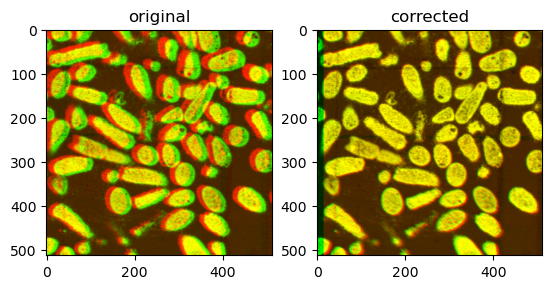

In [47]:
from skimage.registration import phase_cross_correlation
from scipy.ndimage import shift 

def image_to_rgb(image):
    def norm_to_percentile(x, p):
        max = np.nanpercentile(x, p)
        return np.clip(x/max, 0, 1)
    
    arr = np.zeros((*image['amp1625'].shape, 3))
    arr[..., 0] = norm_to_percentile(image.amp1625.fillna(0).data, 95)
    arr[..., 1] = norm_to_percentile(image.amp1650.fillna(0).data, 95)
    return arr

def image_registration_pcc(im, debug=False):
    # print(f'Registering {im.sample_id.item()}-{im.repeat.item()} ({im.file.item()})')
    
    transform, _, _ = phase_cross_correlation(im.hit1625.data, im.hit1650.data)
    warp = lambda x: x.copy(data=shift(x.data, -transform))

    im_warped = xr.Dataset({
        'height':     im.hit1650,
        'deflection': im.def1650,
        'pll':        im.pll1650,
        'phase':      im.pha1650,
        'amp1650':    im.amp1650,
        'amp1625':    warp(im.amp1625),
    })

    if debug:
        print('transform:', transform)
        plt.subplot(121)
        plt.imshow(image_to_rgb(im))
        plt.title('original')
        plt.subplot(122)
        plt.title('corrected')
        plt.imshow(image_to_rgb(im_warped))
    else:
        return im_warped


image_registration_pcc(images_raw['wt_repeats_M1A_rep1'], debug=True)

### OpenCV

pcc transform:
[[ 1.  0. 15.]
 [ 0.  1.  4.]]
transform:
[[ 1.   -0.02 17.89]
 [ 0.    0.99  5.72]]


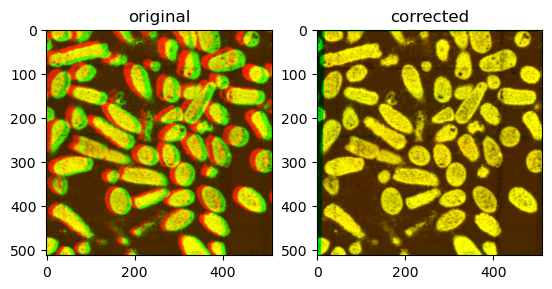

In [48]:
import cv2

def opencv_find_warp(im1, im2, motion_type, initial_guess=None, mask=None):
    """ Return a warp matrix such that, when applied to im2, it aligns with im1"""

    if initial_guess is None: initial_guess = np.eye(2,3).astype(np.float32)

    if mask is None: mask = np.ones_like(im1)
    _, warp_matrix = cv2.findTransformECC(
        im2.astype(np.float32),
        im1.astype(np.float32),
        warpMatrix=initial_guess,
        motionType=motion_type,
        criteria=(cv2.TERM_CRITERIA_COUNT | cv2.TERM_CRITERIA_EPS, int(1e4), 1e-4),
        inputMask=mask.astype(np.uint8),
        gaussFiltSize=1,
    )
    return warp_matrix

def opencv_apply_warp(im, warp):
    im2 = cv2.warpAffine(im.data.astype(np.float32), warp, (512,512))
    im2[im2<im.min().item()] = np.nan
    return im.copy(data=im2)

def image_registration_opencv(im, debug=False):

    # Find estimate using phase correlation
    transform_pcc, error, diffphase = phase_cross_correlation(im.hit1625.data, im.hit1650.data)
    transform_opencv_guess = np.array(
        [[1, 0, -transform_pcc[1]],
         [0, 1, -transform_pcc[0]]]
    ).astype(np.float32)

    # Find warp using ECC
    try:
        warp = opencv_find_warp(im.hit1650.data, im.hit1625.data, cv2.MOTION_AFFINE, transform_opencv_guess.copy())
        im_warped = xr.Dataset({
            'height':     im.hit1650,
            'deflection': im.def1650,
            'pll':        im.pll1650,
            'phase':      im.pha1650,
            'amp1650':    im.amp1650,
            'amp1625':    opencv_apply_warp(im.amp1625, warp),
        })
    except Exception as e:
        print('OpenCV failed, using PCC, image: ', im.sample_id.item())
        warp = lambda x: x.copy(data=shift(x.data, -transform_pcc))
        im_warped = xr.Dataset({
            'height':     im.hit1650,
            'deflection': im.def1650,
            'pll':        im.pll1650,
            'phase':      im.pha1650,
            'amp1650':    im.amp1650,
            'amp1625':    warp(im.amp1625),
        })

    if debug:
        print('pcc transform:')
        print(transform_opencv_guess)
        print('transform:')
        print(warp.round(2))
        plt.subplot(121)
        plt.imshow(image_to_rgb(im))
        plt.title('original')
        plt.subplot(122)
        plt.title('corrected')
        plt.imshow(image_to_rgb(im_warped))
    else: return im_warped

image_registration_opencv(images_raw['wt_repeats_M1A_rep1'], debug=True)

### SIFT and RANSAC

Registering wt_repeats_M1A-1.0 (doc_WTA_rep1_data.axz)


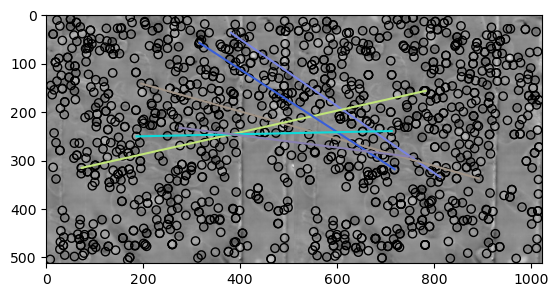

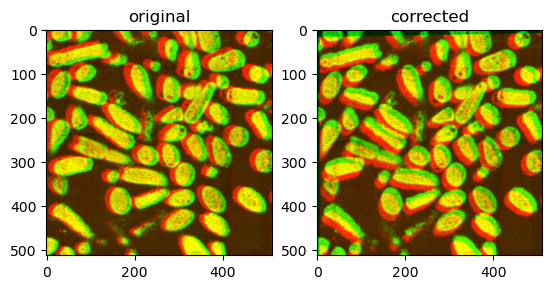

In [49]:
from skimage.feature.sift import SIFT
from skimage.feature import match_descriptors, plot_matches
from skimage.measure import ransac
from skimage.transform import AffineTransform, warp
import seaborn as sns

def get_transform_SR(height_src, height_ref):
    sift = SIFT(
        upsampling=2,
        n_octaves=8,
        n_scales=3,
        sigma_min=5,#1.6,
        sigma_in=0.5,
        c_dog=.5, #0.04 / 3,
        c_edge=10,
        n_bins=36,
        lambda_ori=1.5,
        c_max=0.8,
        lambda_descr=6,
        n_hist=4,
        n_ori=8
    )

    sift.detect_and_extract(height_src.data)
    src_des, src_kp = sift.descriptors, sift.keypoints
    sift.detect_and_extract(height_ref.data)
    ref_des, ref_kp = sift.descriptors, sift.keypoints

    # Match features in both images
    matches_src = match_descriptors(
        src_des,
        ref_des,
        metric=None,
        max_distance=50,
        cross_check=True,
        max_ratio=.3 #1
    )

    # Filter keypoints to remove non-matching
    matches_ref, matches_src = src_kp[matches_src[:, 0]], ref_kp[matches_src[:, 1]]

    # Robustly estimate transform model with RANSAC
    transform, inliers = ransac(
        (matches_ref, matches_src), 
        AffineTransform, 
        min_samples=100,
        residual_threshold=1,
        # max_trials=100,
        # is_data_valid=None,
        # is_model_valid=None,
        # stop_sample_num=np.inf,
        # stop_residuals_sum=0,
        # stop_probability=1,
        # rng=None,
        # initial_inliers=None,
    )
    
    return transform, src_kp, ref_kp, matches_src

def apply_transform_SR(im, transform):
    im_warped = warp(
        im.data,
        transform.inverse,
        order=1,
        mode="constant",
        cval=0,
        clip=True,
        preserve_range=True
    )
    return im.copy(data=im_warped)

def image_registration(im, debug=False):
    print(f'Registering {im.sample_id.item()}-{im.repeat.item()} ({im.file.item()})')
    transform, keypoints1, keypoints2, matches12 = get_transform_SR(im.hit1625.data, im.hit1650.data)

    im_warped = xr.Dataset({
        'height': im.hit1650,
        'deflection': im.def1650,
        'amp1650': im.amp1650,
        'pll1650': im.pll1650,
        'phase1650': im.pha1650,
        'amp1625': apply_transform_SR(im.amp1625, transform),
        'pll1625': apply_transform_SR(im.pll1625, transform),
        'phase1625': apply_transform_SR(im.pha1625, transform),
    })

    if debug:
        # plt.matshow(transform.params)
        # sns.heatmap(transform.params, annot=True, fmt='.2e')
        # plt.figure()
        plot_matches(plt.gca(), im.hit1625.data, im.hit1650.data, 
                     keypoints1, keypoints2, matches12[::50], 
                     only_matches=False)
        plt.figure()
        plt.subplot(121)
        plt.imshow(image_to_rgb(im))
        plt.title('original')
        plt.subplot(122)
        plt.title('corrected')
        plt.imshow(image_to_rgb(im_warped))
    else:
        return im_warped

image_registration(images_raw['wt_repeats_M1A_rep1'], debug=True)

### Actual registration of all images and checking the results

In [50]:
images_aligned = {k: image_registration_opencv(v) for k,v in images_raw.items()}

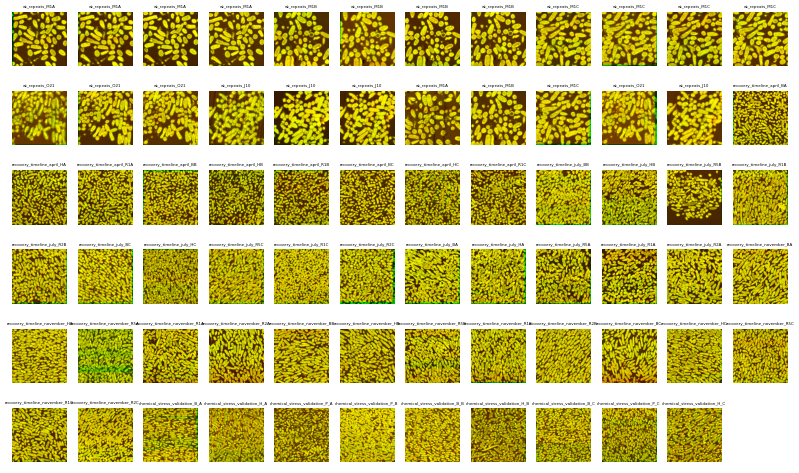

In [51]:
num_rows = 6
num_cols = np.ceil(len(images_aligned)/num_rows).astype(int)
fig, ax = plt.subplots(num_rows, num_cols, figsize=(20,12), dpi=50)
ax = ax.ravel()
for i, image in enumerate(images_aligned.values()): 
    ax[i].imshow(image_to_rgb(image))
    ax[i].set_title(image.sample_id.item(), size='xx-small')
for a in ax: a.axis('off')
# fig.savefig('./cache/registrations.svg', bbox_inches='tight', dpi=600)

## Cell segmentation (amp1650)

In [52]:
import PIL.Image

for im in images_raw.values():
    imagedata = im.amp1625.data
    imagedata = np.uint8(imagedata/np.max(imagedata)*255)
    PIL.Image.fromarray(imagedata).save(f'./cellpose/{im.dataset_id.item()}.png')

In [53]:
from cellpose.models import CellposeModel

cellpose_model = CellposeModel(
    gpu=False, 
    pretrained_model='./cellpose/models/CP_20240117_101759'
)

def run_cellpose(image):
    mask, _, _ = cellpose_model.eval(image.amp1650.data)
    return image.copy().assign(object_labels=(('y', 'x'), mask))

print('starting cellpose')
images_aligned = {k: run_cellpose(im) for k, im in images_aligned.items()}
print('ending cellpose')

starting cellpose
ending cellpose


## IB segmentation (amp1625)

In [54]:
from skimage import morphology, segmentation, filters, measure

def erode_labels(original, kernel):
    """ input: 2d array of ints, background = 0, shrinks masks """
    shrunk = morphology.erosion(original, kernel)
    return np.where(shrunk == original, shrunk, 0)

def segment_ibs(im):

    # Cell segmentation, excluding membranes and cells on the edge
    object_labels = im.object_labels.data
    cell_labels = segmentation.clear_border(object_labels)
    cell_labels = erode_labels(cell_labels, morphology.disk(2))

    # Determining IB threshold
    amp1625 = im.amp1625.data
    bg_intensities = amp1625[object_labels == 0]
    bg_intensities = bg_intensities[np.isfinite(bg_intensities)]
    bg_threshold = np.percentile(bg_intensities, 99.5)
    fg_intensities = amp1625[amp1625>bg_threshold]
    ib_threshold = filters.threshold_triangle(fg_intensities)

    # Process IB labels
    ib_mask = (amp1625 > ib_threshold) 
    ib_mask = ib_mask & (cell_labels != 0)
    ib_mask = morphology.opening(ib_mask, morphology.disk(2))

    ib_labels = measure.label(ib_mask)

    # Define a mask where IBs are cut out of the cells
    cp_labels = xr.where(ib_labels==0, cell_labels, 0)

    # Save to dataset
    return im.copy().assign(
        cell_labels = (['y', 'x'], cell_labels),
        cp_labels   = (['y', 'x'], cp_labels),
        ib_labels   = (['y', 'x'], ib_labels),
    )

# Run segmentation
images_aligned = {k: segment_ibs(im) for k, im in images_aligned.items()}

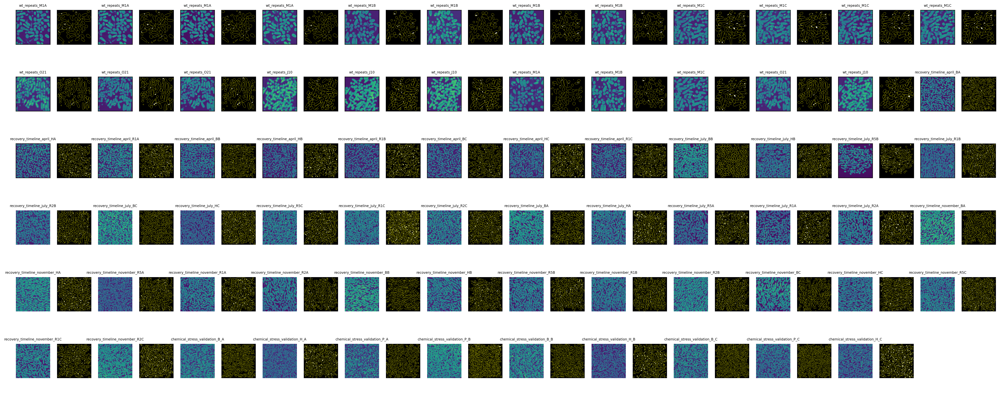

In [55]:
def plot_seg(ax, im):
    ax.imshow(segmentation.mark_boundaries(
        im.ib_labels.astype(bool),
        im.cell_labels,
        mode='thick'
    ))
    ax.set(xticks=[], yticks=[])

num_rows = 6
num_cols = np.ceil(len(images_aligned)/num_rows).astype(int)
fig, ax = plt.subplots(num_rows, num_cols*2, figsize=(30,12), dpi=300)

ax = ax.flatten()

for i, im in enumerate(images_aligned.values()):
    ax[i*2].imshow(im.amp1650)
    plot_seg(ax[i*2+1], im)
    ax[i*2].set(xticks=[], yticks=[])
    ax[i*2].set_title(im.sample_id.item(), size='xx-small')

for a in ax[i+1:]: a.axis('off')

In [56]:
dataset_ids_by_experiment = {
    e: [im.dataset_id.item() for im in images_aligned.values() if im.experiment.item() == e]
    for e in metadata.experiment.unique()
}
dataset_ids_by_experiment = {
    e: [im.dataset_id.item() for im in images_aligned.values() if im.experiment.item() == e]
    for e in metadata.experiment.unique()
}

widget_experiments = widgets.Dropdown(options=dataset_ids_by_experiment.keys())
widget_datasets = widgets.Dropdown(options=dataset_ids_by_experiment[widget_experiments.value])

@widgets.interact(experiment=widget_experiments, dataset=widget_datasets)
def plot_segmentation_qc(experiment, dataset):
    valid_options = dataset_ids_by_experiment[experiment]
    widget_datasets.options = valid_options
    dataset = widget_datasets.value

    im = images_aligned[dataset]
    # fig, ax = plt.subplots(1, 3, figsize=(15,5))
    plt.close('figid')
    fig = plt.figure('figid', figsize=(15,5))
    ax = fig.subplots(1, 3)
    ax[0].imshow(image_to_rgb(im))
    ax[1].imshow(segmentation.mark_boundaries(
        np.clip(im.amp1625.fillna(0)/im.amp1625.max(), 0, 1),
        im.object_labels,
        mode='thick'
    ))
    ax[2].imshow(segmentation.mark_boundaries(
        im.ib_labels.astype(bool),
        im.cell_labels,
        mode='thick'
    ))

    fig.suptitle(im.dataset_id.item())
    for a in ax: a.axis('off')


interactive(children=(Dropdown(description='experiment', options=('wt_repeats', 'recovery_timeline', 'chemical…

In [57]:
@widgets.interact(exp=widgets.Dropdown(options=metadata.experiment.unique(), value='chemical_stress_validation'))
def choose_experiment(exp):
    images_subset = {k: v for k,v in images_aligned.items() if k.startswith(exp)}

    @widgets.interact(image_num=widgets.IntSlider(value=0, min=0, max=len(images_subset)-1))
    def plot_segmentation_qc(image_num):
        im = list(images_aligned.values())[image_num]
        fig, ax = plt.subplots(1, 3, figsize=(15,5))
        ax[0].imshow(image_to_rgb(im))
        ax[1].imshow(segmentation.mark_boundaries(
            np.clip(im.amp1625.fillna(0)/im.amp1625.max(), 0, 1),
            im.object_labels,
            mode='thick'
        ))
        ax[2].imshow(segmentation.mark_boundaries(
            im.ib_labels.astype(bool),
            im.cell_labels,
            mode='thick'
        ))

        fig.suptitle(im.dataset_id.item())
        for a in ax: a.axis('off')

    return plot_segmentation_qc


interactive(children=(Dropdown(description='exp', index=3, options=('wt_repeats', 'recovery_timeline', 'chemic…

## Save images (+final PLL processing)

In [58]:
def process(im):
    epoxy_pll = (
        im.pll.where(im.object_labels == 0).mean('x') 
          .rolling(y=5, min_periods=1)
    )

    epoxy_pll_mean = epoxy_pll.mean()
    epoxy_pll_std = epoxy_pll.std()
    
    return im.assign(
        pll = im.pll - epoxy_pll_mean,
        pll_z = (im.pll - epoxy_pll_mean) / epoxy_pll_std,
        height = aptwrapper.subtract_lines(im.height, degree=2),
    )

with open('./cache/maps_aligned.pkl', 'wb') as f:
    pickle.dump(images_aligned, f)

images_aligned_processed = {k: process(v) for k,v in images_aligned.items()}
with open('./cache/maps_aligned_processed.pkl', 'wb') as f:
    pickle.dump(images_aligned_processed, f)

## Quantification

In [59]:
import pandas as pd
from skimage import measure
import numpy as np

def rprop_table(label_image, intensity_image, **props):
    # props is a dict mapping field names to functions or strings representing inbuilt functions

    # Add `label` by default
    if 'label' not in props: props['label'] = 'label'
    
    # Split into inbuilt props and custom ones (where you need to provide a function)
    props_string = {k:v for k,v in props.items() if isinstance(v, str)}
    props_custom = {k:v for k,v in props.items() if callable(v)}

    return (
        # Calculate the properties
        pd.DataFrame(measure.regionprops_table(
            label_image.data,
            intensity_image.data,
            list(props_string.values()),
            extra_properties=list(props_custom.values())
        ))
        .set_index('label')
        # Rename columns to match the names in props
        .rename(columns={v:k for k,v in props_string.items()})
        .rename(columns={v.__name__:k for k,v in props_custom.items()})
    )

def classify_cell(ib_polar_projection: pd.Series):
    """
    Given a series of polarity values of inclusions for this cell, 
    classify the cell inclusion type
    """
    THRESHOLD = .3
    n_pole1 = np.sum(ib_polar_projection < -THRESHOLD)
    n_pole2 = np.sum(ib_polar_projection >  THRESHOLD)

    assert len(ib_polar_projection) != 0
    if len(ib_polar_projection) == 2 and n_pole1 == 1 and n_pole2 == 1: 
        return 'bipolar'
    if len(ib_polar_projection) > 1:
        return 'multi-spotted'
    else:
        if n_pole1 + n_pole2 == 1: 
            return 'unipolar'
        else: 
            return 'nonpolar'

def calculate_stats(images):

    def calculate_stats_for_image(im):
        dx = im.X.diff('x').data[0,0]

        # Custom functions
        def num_ibs(cell_labels, ib_labels):
            return len(np.unique(ib_labels[cell_labels != 0])) - 1
        def intensity_sum(img_mask, img_intensity):
            return img_intensity.sum().astype(int)
        def intensity_std(img_mask, img_intensity):
            return img_intensity.std().astype(int)
        def num_cells(ib_mask, cell_labels):
            values = cell_labels[ib_mask]
            return len(np.unique(values)) - int(0 in values)
        
        # Base cell table
        celltable = rprop_table(
            im['cell_labels'],
            im['ib_labels'] != 0,
            centroid='centroid', 
            cell_orientation='orientation', 
            cell_eccentricity='eccentricity', 
            cell_axis_major_length='axis_major_length', 
            cell_axis_minor_length='axis_minor_length', 
            cell_frac_ib='intensity_mean', 
            cell_area='area',
            cell_area_ib_px=intensity_sum
        ).join(rprop_table(
            im['cell_labels'],
            im['ib_labels'],
            cell_num_ibs=num_ibs)
        ).join(rprop_table(
            im['cp_labels'],
            im['amp1625'],
            cp_1625_mean='intensity_mean')
        ).join(rprop_table(
            im['cp_labels'],
            im['height'],
            cp_height_mean='intensity_mean', 
            cp_height_std=intensity_std)
        ).join(rprop_table(
            im['cp_labels'],
            im['amp1650'],
            cp_1650_mean='intensity_mean')
        ).join(rprop_table(
            im['cp_labels'],
            im['pll'],
            cp_pll_mean='intensity_mean', 
            cp_pll_std=intensity_std)
        ).join(rprop_table(
            im['cp_labels'],
            im['pll_z'],
            cp_pll_z_mean='intensity_mean', 
            cp_pll_z_std=intensity_std)
        ).assign(
            cp_beta_ratio=lambda df: df.cp_1625_mean/df.cp_1650_mean,
            cell_orientation=lambda df: np.where(df.cell_orientation < 0, df.cell_orientation - np.pi, df.cell_orientation),
        ).rename_axis('cell_label')

        # Base IB table
        ibtable = rprop_table(
            im['ib_labels'],
            im['cell_labels'],
            cell_label='intensity_mean',
            ib_area_px='area', 
            ib_eccentricity='eccentricity',
            centroid='centroid', 
            ib_num_cells=num_cells
        ).join(rprop_table(
            im['ib_labels'],
            im['amp1625'],
            ib_1625_mean='intensity_mean',
            ib_1625_std=intensity_std
        )).join(rprop_table(
            im['ib_labels'],
            im['amp1650'],
            ib_1650_mean='intensity_mean',
            ib_1650_std=intensity_std
        )).join(rprop_table(
            im['ib_labels'],
            im['pll'],
            ib_pll_mean='intensity_mean', 
            ib_pll_std=intensity_std
        )).join(rprop_table(
            im['ib_labels'],
            im['pll_z'],
            ib_pll_z_mean='intensity_mean', 
            ib_pll_z_std=intensity_std
        )).join(rprop_table(
            im['ib_labels'],
            im['height'],
            ib_height_mean='intensity_mean', 
            ib_height_std=intensity_std
        )).assign(
            ib_beta_ratio=lambda df: df.ib_1625_mean/df.ib_1650_mean,
            ib_area = lambda df: df.ib_area_px * dx ** 2,
            ib_area_log = lambda df: np.log(df.ib_area),
        ).rename_axis('ib_label')

        # Calculate IB polarity
        def from_celltable(col): 
            return celltable.loc[ibtable.cell_label][col].to_numpy()
        d0 = ibtable['centroid-0'] - from_celltable('centroid-0')
        d1 = ibtable['centroid-1'] - from_celltable('centroid-1')
        theta = from_celltable('cell_orientation')
        r = from_celltable('cell_axis_major_length')
        ibtable = ibtable.assign(
            # This formula sets IBs in the pole to in the positive y direction (data coordinates, not pixel coordinates) to the positive pole
            ib_polar_projection = 2 * (d0 / r * np.cos(theta) + d1 / r * np.sin(theta)),
            ib_polar_projection_abs= lambda df: np.abs(df.ib_polar_projection),
        )

        # Celltable extras
        celltable['cell_classification'] = ibtable.groupby('cell_label').ib_polar_projection.agg(classify_cell).astype(str)
        celltable.loc[celltable.cell_classification.isna(), 'cell_classification'] = 'empty'
        celltable['ib_centroid_y_frac'] = celltable['centroid-0'] / im.dims['y']

        # Save metadata
        skipcols = ['amp1625','amp1650','spectra_ib','spectra_cp','spectra_bg',]
        for var in metadata.columns:
            if var in skipcols: continue
            ibtable[var] = im[var].item()
            celltable[var] = im[var].item()

        # Join host cell information into ib table
        ibtable = (
            pd.merge(
                ibtable.reset_index(), celltable, on='cell_label', suffixes=(None, '_cell')
            ).set_index(
                ['replicate', 'ib_label']
            )
        )
        ibtable.cell_label = ibtable.cell_label.astype(int)

        # Calculate beta ratio differences
        ibtable['beta_ratio_fc'] = ibtable.ib_beta_ratio / ibtable.cp_beta_ratio
        ibtable['beta_ratio_diff'] = ibtable.ib_beta_ratio - ibtable.cp_beta_ratio
        ibtable['ib_pll_diff'] = ibtable.ib_pll_mean - ibtable.cp_pll_mean

        # Set indices
        celltable = celltable.reset_index().set_index(['series', 'condition', 'replicate', 'cell_label'])
        ibtable = ibtable.reset_index().set_index(['series', 'condition', 'replicate', 'ib_label'])

        return celltable, ibtable

    # Calculate stats for each image and aggregate them
    tables    = [calculate_stats_for_image(image) for image in images.values()]
    celltable = pd.concat(t[0] for t in tables).reset_index()
    ibtable   = pd.concat(t[1] for t in tables).reset_index()

    return celltable, ibtable

celltable, ibtable = calculate_stats(images_aligned_processed)

pickle.dump(celltable, open('./cache/celltable.pkl', 'wb'))
pickle.dump(ibtable, open('./cache/ibtable.pkl', 'wb'))
celltable = pickle.load(open('./cache/celltable.pkl', 'rb'))
ibtable = pickle.load(open('./cache/ibtable.pkl', 'rb'))

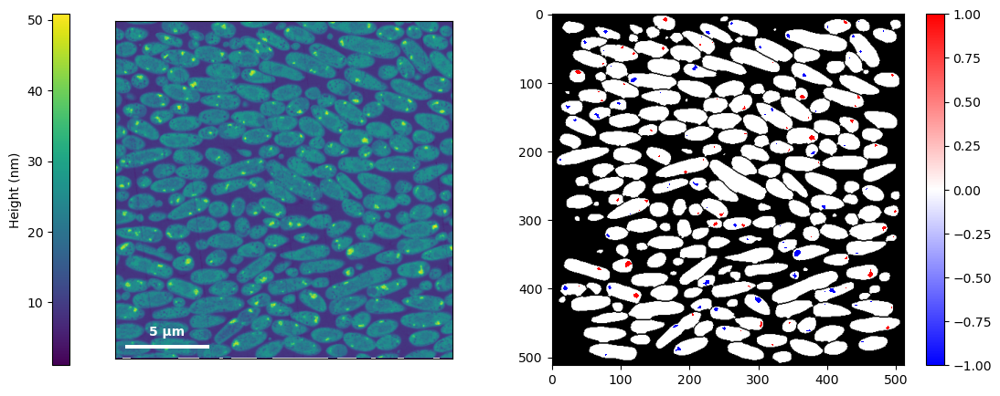

In [60]:
im = images_aligned_processed['recovery_timeline_november_HA']

r = (im.ib_labels.astype(float))
for i, row in ibtable.query('dataset_id=="recovery_timeline_november_HA"').iterrows():
    r = np.where(r==row.ib_label, row.ib_polar_projection/np.abs(row.ib_polar_projection), r)
r = np.where(r==0, np.nan, r)

plt.figure(figsize=(14,5))
plt.subplot(122)
plt.imshow(im.cell_labels.astype(bool), cmap='gray')
plt.imshow(r, vmin=-1, vmax=1, cmap='bwr', alpha=1)
plt.colorbar()
plt.subplot(121)
aptwrapper.plot_map(im.amp1625, flatten=False, cmap='viridis')